### 1) Main objective of the analysis

It is important to note that interpreting the accuracy of the prediction should not be considered as the ultimate accuracy result. It is simply because we are only investigating based on the current specification of the task, which is to select the best regression model. In practice, we should consider testing with other models such as Random Forest, eXtreme Gradient Boosting, Support Vector Machines, Artificial Neural Network and etc.

### 2) Brief description of the dataset and a summary of its attributes

Attribute Information:

Thirteen (13) clinical features:

- age: age of the patient (years)
- anaemia: decrease of red blood cells or hemoglobin (boolean)
- high blood pressure: if the patient has hypertension (boolean)
- creatinine phosphokinase (CPK): level of the CPK enzyme in the blood (mcg/L)
- diabetes: if the patient has diabetes (boolean)
- ejection fraction: percentage of blood leaving the heart at each contraction (percentage)
- platelets: platelets in the blood (kiloplatelets/mL)
- sex: woman or man (binary)
- serum creatinine: level of serum creatinine in the blood (mg/dL)
- serum sodium: level of serum sodium in the blood (mEq/L)
- smoking: if the patient smokes or not (boolean)
- time: follow-up period (days)
- [target] death event: if the patient deceased during the follow-up period (boolean) 


### Exploratory Data Analysis

In [52]:

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn import model_selection
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
data = pd.read_csv('heart_failure_clinical_records_dataset.csv')

In [3]:
data.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [4]:
print(f"We have a total of {data.shape[0]} patients")

We have a total of 299 patients


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [6]:
data.isnull().sum()

age                         0
anaemia                     0
creatinine_phosphokinase    0
diabetes                    0
ejection_fraction           0
high_blood_pressure         0
platelets                   0
serum_creatinine            0
serum_sodium                0
sex                         0
smoking                     0
time                        0
DEATH_EVENT                 0
dtype: int64

Looks like we do not have missing values.

In [7]:
#Only use this if wanna reset seaborn theme
matplotlib.rc_file_defaults()
sns.reset_orig

<function seaborn.rcmod.reset_orig()>

In [8]:
#sns.set_palette("Accent_r")

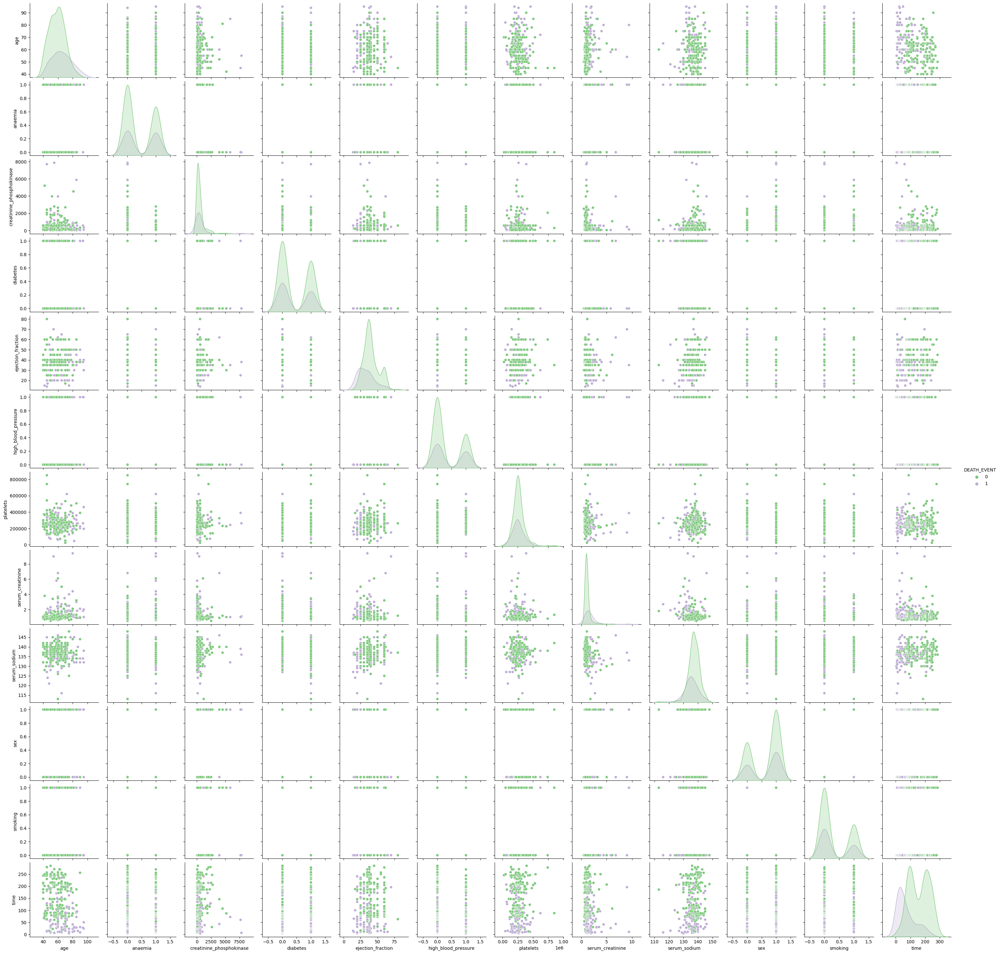

In [9]:
sns.pairplot(data, hue='DEATH_EVENT', palette='Accent')

In [10]:
data['sex'].unique()

array([1, 0])

In [11]:
def category_count(data:pd.DataFrame, col:str):
    assert type(data) == pd.DataFrame
    assert type(col) == str
    zero = one = 0
    one = [one+1 for i in data[col] if i == 1]
    zero = [zero+1 for i in data[col] if i == 0]
    return sum(zero), sum(one)

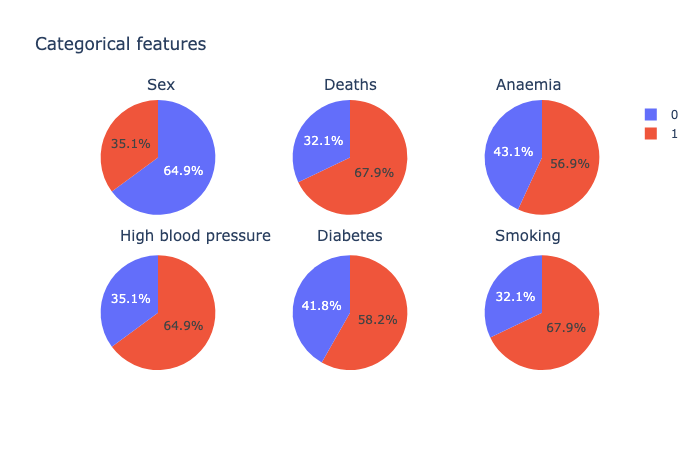

In [12]:
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=2, cols=3, specs=[[{'type':'domain'}, {'type':'domain'},{'type':'domain'}],\
                                           [{'type':'domain'}, {'type':'domain'},{'type':'domain'}]])
labels = [1, 0]
hole=0
gender_vals = list(category_count(data, 'sex'))
death_vals = list(category_count(data, 'DEATH_EVENT'))
anaemia_vals = list(category_count(data, 'anaemia'))
high_blood_pressure_vals = list(category_count(data, 'high_blood_pressure'))
diabetes_vals = list(category_count(data, 'diabetes'))
smoking_vals = list(category_count(data, 'smoking'))


fig.add_trace(go.Pie(labels=labels, values=gender_vals, name="Sex", hole=hole),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=death_vals, name="Deaths", hole=hole),
              1, 2)
fig.add_trace(go.Pie(labels=labels, values=anaemia_vals, name="Anaemia", hole=hole),
              1, 3)
fig.add_trace(go.Pie(labels=labels, values=high_blood_pressure_vals, name="high_blood_pressure", hole=hole),
              2, 1)
fig.add_trace(go.Pie(labels=labels, values=diabetes_vals, name="diabetes", hole=hole),
              2, 2)
fig.add_trace(go.Pie(labels=labels, values=smoking_vals, name="smoking", hole=hole),
              2, 3)

fig.update_layout(
    title_text="Categorical features",
    annotations=[dict(text='Sex', x=0.12, y=1.1, font_size=15, showarrow=False),
                 dict(text='Deaths', x=0.50, y=1.1, font_size=15, showarrow=False),
                 dict(text='Anaemia', x=0.895, y=1.1, font_size=15, showarrow=False),
                 dict(text='High blood pressure', x=0.07, y=0.5, font_size=15, showarrow=False),
                 dict(text='Diabetes', x=0.50, y=0.5, font_size=15, showarrow=False),
                 dict(text='Smoking', x=0.895, y=0.5, font_size=15, showarrow=False)])

fig.show(renderer='png')

According to the dataset owner, the patients consist of 105 female and 194 male. This correspond with the following label 0 for female and 1 for male.

In [13]:
#plt.rcParams["patch.force_edgecolor"] = True
sns.set_style('whitegrid')
sns.set_palette='flare'

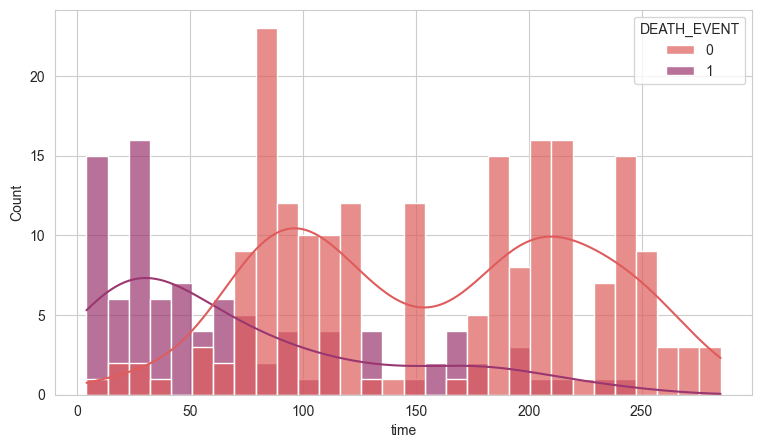

In [14]:
plt.figure(figsize=(9, 5))
sns.histplot(data, x='time', hue='DEATH_EVENT', kde=True, bins=30, alpha=0.7, palette='flare')
#axes[0].set_title('')
fig.show()

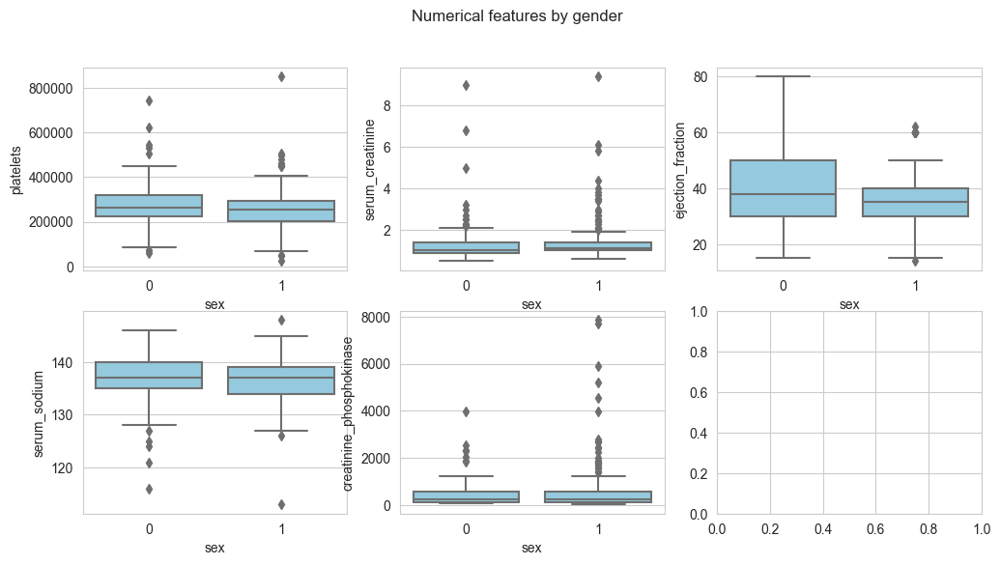

In [15]:
fig, axes = plt.subplots(2, 3, figsize=(12, 6))

fig.suptitle('Numerical features by gender')

sns.boxplot(ax=axes[0, 0], data=data, x='sex', y='platelets', color='skyblue')
sns.boxplot(ax=axes[0, 1], data=data, x='sex', y='serum_creatinine', color='skyblue')
sns.boxplot(ax=axes[0, 2], data=data, x='sex', y='ejection_fraction', color='skyblue')
sns.boxplot(ax=axes[1, 0], data=data, x='sex', y='serum_sodium', color='skyblue')
sns.boxplot(ax=axes[1, 1], data=data, x='sex', y='creatinine_phosphokinase', color='skyblue')

plt.show()

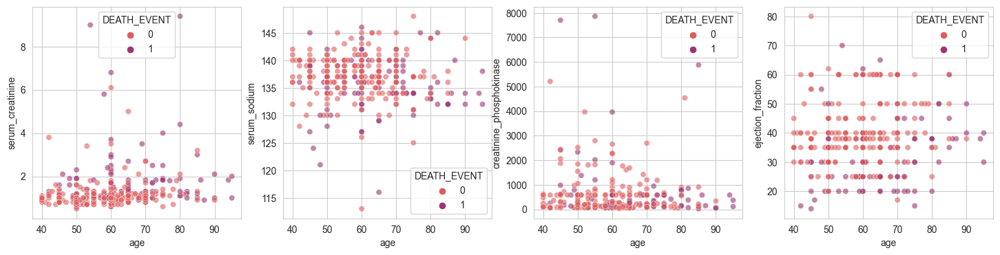

In [16]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4))

sns.scatterplot(ax=axes[0], data=data, x='age', y='serum_creatinine', hue='DEATH_EVENT', alpha=0.6, palette='flare')
sns.scatterplot(ax=axes[1], data=data, x='age', y='serum_sodium', hue='DEATH_EVENT', alpha=0.6, palette='flare')
sns.scatterplot(ax=axes[2], data=data, x='age', y='creatinine_phosphokinase', hue='DEATH_EVENT', alpha=0.6, palette='flare')
sns.scatterplot(ax=axes[3], data=data, x='age', y='ejection_fraction', hue='DEATH_EVENT', alpha=0.6, palette='flare')
plt.show()

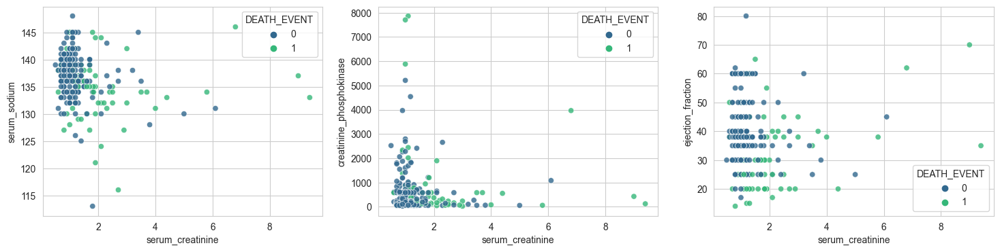

In [17]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

sns.scatterplot(ax=axes[0], data=data, x='serum_creatinine', y='serum_sodium', hue='DEATH_EVENT', alpha=0.8, palette='viridis')
sns.scatterplot(ax=axes[1], data=data, x='serum_creatinine', y='creatinine_phosphokinase', hue='DEATH_EVENT', alpha=0.8, palette='viridis')
sns.scatterplot(ax=axes[2], data=data, x='serum_creatinine', y='ejection_fraction', hue='DEATH_EVENT', alpha=0.8, palette='viridis')
plt.show()

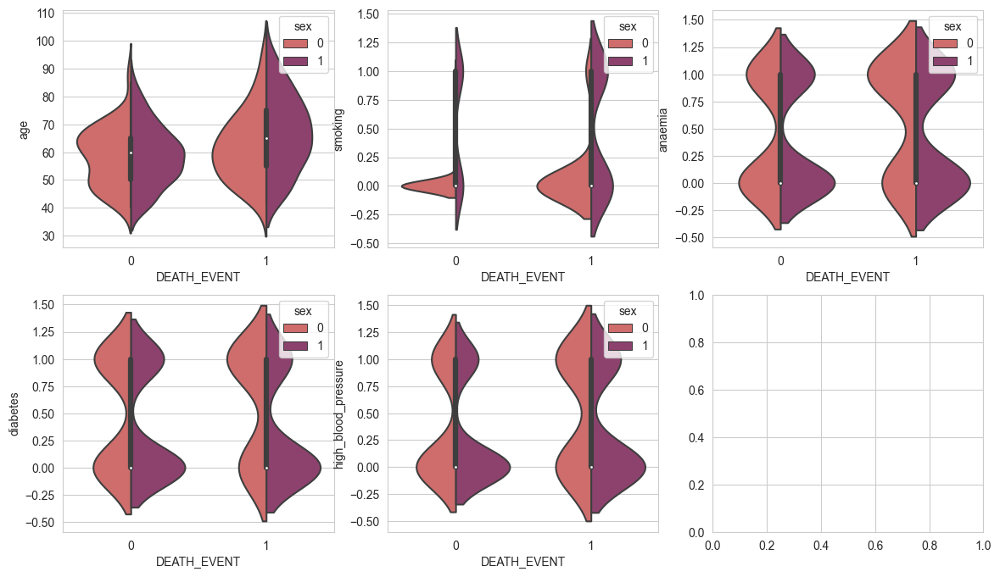

In [18]:
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
#plt.figure(figsize=(9, 6))
#sns.violinplot(data=data, x="DEATH_EVENT", y="smoking", hue="sex", split=True, palette='flare')

sns.violinplot(ax=axes[0,0], data=data, x='DEATH_EVENT', y='age', hue='sex', palette='flare', split=True)
sns.violinplot(ax=axes[0,1], data=data, x='DEATH_EVENT', y='smoking', hue='sex', palette='flare', split=True)
sns.violinplot(ax=axes[0,2], data=data, x='DEATH_EVENT', y='anaemia', hue='sex', palette='flare', split=True)
sns.violinplot(ax=axes[1,0], data=data, x='DEATH_EVENT', y='diabetes', hue='sex', palette='flare', split=True)
sns.violinplot(ax=axes[1,1], data=data, x='DEATH_EVENT', y='high_blood_pressure', hue='sex', palette='flare', split=True)
plt.show()

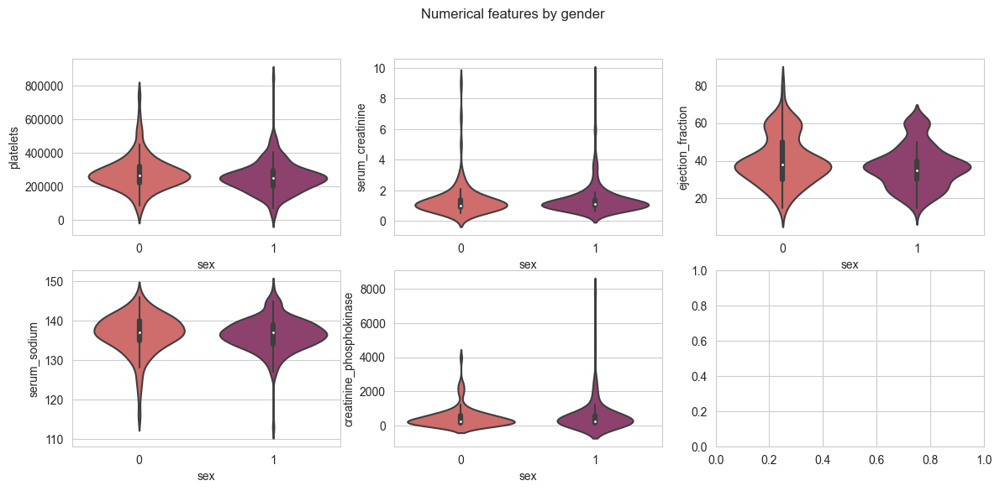

In [19]:
fig, axes = plt.subplots(2, 3, figsize=(14, 6))

fig.suptitle('Numerical features by gender')

sns.violinplot(ax=axes[0, 0], data=data, x='sex', y='platelets', palette='flare', split=True)
sns.violinplot(ax=axes[0, 1], data=data, x='sex', y='serum_creatinine', palette='flare', split=True)
sns.violinplot(ax=axes[0, 2], data=data, x='sex', y='ejection_fraction', palette='flare', split=True)
sns.violinplot(ax=axes[1, 0], data=data, x='sex', y='serum_sodium', palette='flare', split=True)
sns.violinplot(ax=axes[1, 1], data=data, x='sex', y='creatinine_phosphokinase', palette='flare', split=True)
plt.show()

In [20]:
data['time'].unique()

array([  4,   6,   7,   8,  10,  11,  12,  13,  14,  15,  16,  20,  22,
        23,  24,  26,  27,  28,  29,  30,  31,  32,  33,  35,  38,  40,
        41,  42,  43,  44,  45,  50,  54,  55,  59,  60,  61,  63,  64,
        65,  66,  67,  68,  71,  72,  73,  74,  75,  76,  77,  78,  79,
        80,  82,  83,  85,  86,  87,  88,  90,  91,  94,  95,  96,  97,
       100, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 115, 117,
       118, 119, 120, 121, 123, 126, 129, 130, 134, 135, 140, 145, 146,
       147, 148, 150, 154, 162, 170, 171, 172, 174, 175, 180, 185, 186,
       187, 188, 192, 193, 194, 195, 196, 197, 198, 200, 201, 205, 206,
       207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 220, 230, 231,
       233, 235, 237, 240, 241, 244, 245, 246, 247, 250, 256, 257, 258,
       270, 271, 278, 280, 285])

In [82]:
def bin_age(data):
    month = count = 0
    n = 30
    for t in data['age']:
        count+=1
        if count == 30:
            count = 0
            month +=1
    return month

In [83]:
bin_age(data)

9

### Feature Importance

In [28]:
from sklearn.ensemble import RandomForestRegressor

feats = ['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes', 'ejection_fraction', 'high_blood_pressure', \
    'platelets', 'serum_creatinine', 'serum_sodium', 'smoking', 'sex']

X = data[feats].values
y = data['DEATH_EVENT'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

rf = RandomForestRegressor(n_estimators=100)
rf.fit(X_train, y_train)


RandomForestRegressor()

In [29]:
rf.feature_importances_

array([0.14950853, 0.01030371, 0.1233671 , 0.01929473, 0.1873038 ,
       0.01700923, 0.11102986, 0.26522227, 0.08779685, 0.01255123,
       0.01661267])

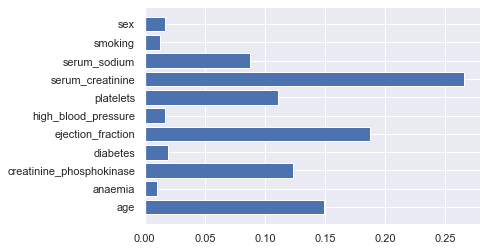

In [31]:
plt.barh(feats, rf.feature_importances_)
plt.show()

In [32]:
import shap

explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

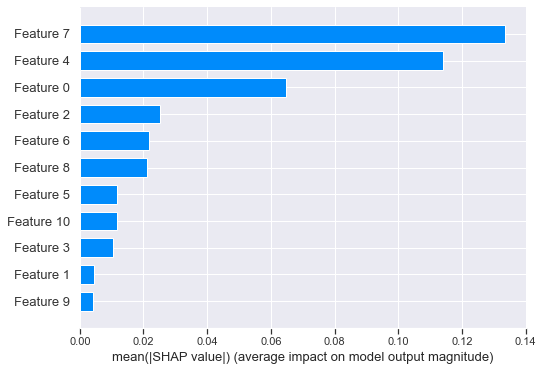

In [33]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

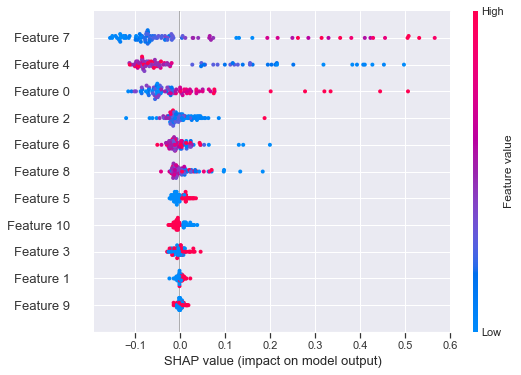

In [34]:
shap.summary_plot(shap_values, X_test)

In [35]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, y_train)


RandomForestClassifier()

In [36]:
rfc.feature_importances_

array([0.14692355, 0.02047335, 0.12193642, 0.02500524, 0.18252145,
       0.02299541, 0.11297042, 0.22186241, 0.10006557, 0.02216765,
       0.02307854])

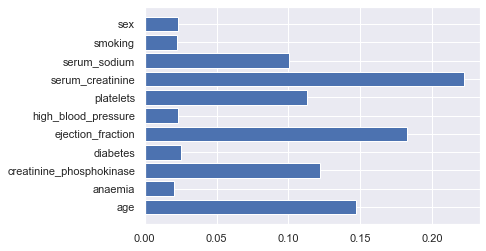

In [38]:
plt.barh(feats, rfc.feature_importances_)
plt.show()

In [39]:
explainer2 = shap.TreeExplainer(rfc)
shap_values2 = explainer2.shap_values(X_test)

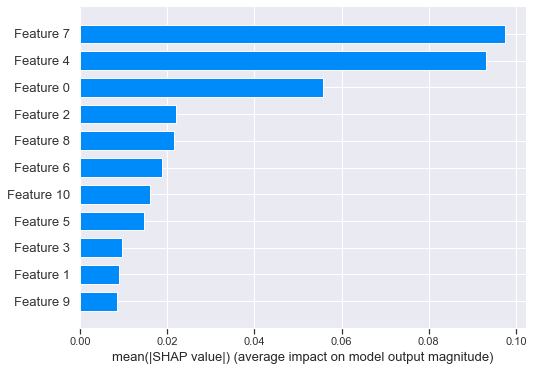

In [40]:
shap.summary_plot(shap_values2[1], X_test, plot_type="bar")

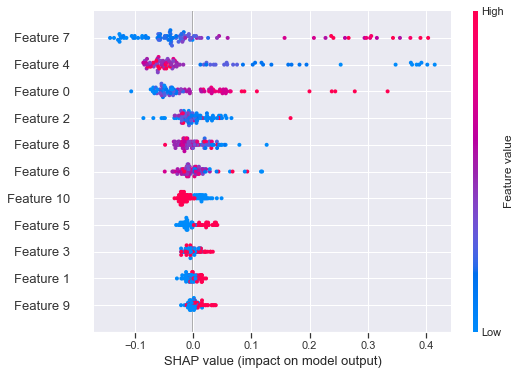

In [41]:
shap.summary_plot(shap_values2[1], X_test)

In [42]:
from xgboost import XGBClassifier

xgbc = XGBClassifier()
xgbc.fit(X_train, y_train)


[00:18:17] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [43]:
print(xgbc.feature_importances_)

[0.1183822  0.03519903 0.07911544 0.04848769 0.1497865  0.06650981
 0.05392934 0.20029064 0.06772236 0.06026926 0.12030781]


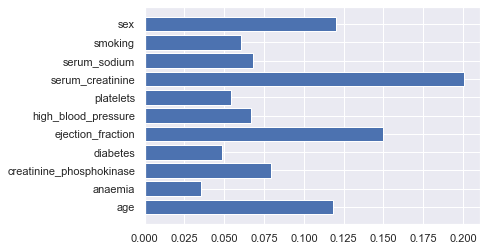

In [45]:
plt.barh(feats, xgbc.feature_importances_)
plt.show()

### Model training and selection

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split 
from sklearn.model_selection import cross_validate,KFold
from sklearn import preprocessing

In [47]:
X = pd.DataFrame(data, columns= ['serum_creatinine', 'ejection_fraction', 'age'])
X2 = pd.DataFrame(data, columns= ['serum_creatinine', 'ejection_fraction', 'age', 'creatinine_phosphokinase'])
X3 = pd.DataFrame(data, columns= ['serum_creatinine', 'ejection_fraction'])
y = pd.DataFrame(data, columns=['DEATH_EVENT'])

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [49]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size=0.3, random_state=42)

In [50]:
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y, test_size=0.3, random_state=42)

In [53]:
regressor = LinearRegression()
scores = []

kfold = KFold(n_splits=15, shuffle=True, random_state=42)
#kfold = model_selection.KFold(n_splits=10)
regressor.fit(X_train, y_train)

results_regressor = model_selection.cross_val_score(regressor, X_test, y_test, cv=kfold)


In [54]:
print("Accuracy: %.2f%%" % (results_regressor.mean()*100.0)) 

Accuracy: -2.23%


In [55]:
r2 = regressor.score(X,y)

In [57]:
print(regressor.intercept_)
print(regressor.coef_)


[-0.13681387]
[[ 0.1472963  -0.01007986  0.00994086]]


In [58]:
 cv_results = cross_validate(regressor,X,y,scoring='r2',cv=kfold)
 cv_results

{'fit_time': array([0.01396585, 0.00687075, 0.00555706, 0.00547123, 0.00637889,
        0.00660825, 0.00652409, 0.00869298, 0.00553703, 0.00922704,
        0.00612998, 0.00813699, 0.00711298, 0.00643086, 0.00633121]),
 'score_time': array([0.00724792, 0.00490308, 0.00416684, 0.00453472, 0.00566602,
        0.0062499 , 0.00551105, 0.00400424, 0.00441098, 0.00487113,
        0.00519896, 0.00504208, 0.00532985, 0.00442386, 0.00518394]),
 'test_score': array([ 0.12522797, -0.15989164,  0.19739682,  0.14080252,  0.15975231,
         0.42122483, -0.28178597,  0.54753862,  0.31957664,  0.23959507,
        -0.38892298,  0.13446999, -0.03252755,  0.26392623, -1.16289451])}

In [59]:
print('r2 training: '+str(r2))
print('r2 cross val: ' +str(cv_results['test_score'].mean()))

r2 training: 0.19697934240561565
r2 cross val: 0.03489922417225344


In [60]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)

result = logreg.score(X_test, y_test)
print("Accuracy: %.2f%%" % (result*100.0))

Accuracy: 65.56%


In [61]:
from sklearn import model_selection   


logreg_kfold = LogisticRegression()
kfold = model_selection.KFold(n_splits=10)

logreg_kfold.fit(X_train, y_train)

results_kfold = model_selection.cross_val_score(logreg_kfold, X_test, y_test, cv=kfold)
print("Accuracy: %.2f%%" % (results_kfold.mean()*100.0)) 

Accuracy: 71.11%


In [62]:
from sklearn import model_selection   


logreg_kfold = LogisticRegression()
kfold = model_selection.KFold(n_splits=10)

logreg_kfold.fit(X2_train, y2_train)

results_kfold = model_selection.cross_val_score(logreg_kfold, X2_test, y2_test, cv=kfold)
print("Accuracy logreg_kfold: %.2f%%" % (results_kfold.mean()*100.0)) 

Accuracy logreg_kfold: 70.00%


In [63]:
from sklearn import model_selection   


logreg_kfold = LogisticRegression()
kfold = model_selection.KFold(n_splits=10)

logreg_kfold.fit(X3_train, y3_train)

results_kfold = model_selection.cross_val_score(logreg_kfold, X3_test, y3_test, cv=kfold)
print("Accuracy: %.2f%%" % (results_kfold.mean()*100.0)) 

Accuracy: 70.00%


In [64]:
from sklearn.model_selection import StratifiedKFold

logreg_skfold = LogisticRegression()
skfold = StratifiedKFold(n_splits=10)

logreg_skfold.fit(X2_train, y2_train)

results_skfold = model_selection.cross_val_score(logreg_skfold, X2_test, y2_test, cv=skfold)
print("Accuracy logreg_skfold: %.2f%%" % (results_skfold.mean()*100.0)) 

Accuracy logreg_skfold: 65.56%


### 3) Brief summary of data exploration and actions taken for data cleaning and feature engineering

1. We use Random Forest Regressor and Random Forest Classifier to find important features. The selected top 3 features are serum_creatinine, age and ejection_fraction.

2.

### 4) Summary of training at least three linear regression models (in  terms of explainability and predictability)

### 5) Recommendation of chosen regression as the final model

### 6) Summary Key Findings and Insights

### 7) Suggestions for next steps in analyzing this data
